##  Univariate time series forecasting test on PC4 5501 using XGBOOST


In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
!pip install altair
import altair as alt

import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import xgboost as xgb
from xgboost import plot_importance, plot_tree


# show all columns in the dataframe
pd.set_option('max_columns', None)

In [2]:
os.getcwd()

'C:\\Users\\jcdek\\OneDrive\\Documents\\GitHub\\jads_enexis\\notebooks'

In [3]:
# variables used in script
data_processed_location = '../data/processed'

if 'processed' not in os.getcwd():
    os.chdir(data_processed_location)

# kleinverbruikgegevens gegevens inlezen
df_pc4 = pd.read_hdf('pc4_verbruiksdata.h5')


In [4]:
df_pc4.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6806402 entries, 2010-01-01 to 2021-12-31
Data columns (total 3 columns):
 #   Column    Dtype  
---  ------    -----  
 0   RES       object 
 1   PC4       int64  
 2   VERBRUIK  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 207.7+ MB


In [5]:
# Verbruik time series for total Enexis area - NOT USED 
# df_all = df_pc4.groupby(df_pc4.index, as_index=True)['VERBRUIK'].sum()

In [31]:
# Create some QC plots for a range of PC4's (4251-4288). N.B. Not all PC's have Verbruik data.  
df_plot = df_pc4[df_pc4['PC4'] <= 4288].copy()

# Interactive plot.  A number of odd looking series in this limited range out of total of 1400+ PC4's
alt.data_transformers.disable_max_rows()

select_pc4 = alt.selection_single(
    name='select', fields=['PC4'], init={'PC4': 4251},
    bind=alt.binding_range(min=4251, max=4288, step=1))

alt.Chart(df_plot.reset_index()).mark_line(clip=True).encode(
    alt.X('DATUM:T'),
    alt.Y('VERBRUIK:Q'),
    alt.Color('RES:N')).add_selection(select_pc4).transform_filter(select_pc4).properties(
    width=800,height=400)


alt.Chart(...)

In [7]:
# Zoom in on PC4=5501 time series 
df_pc4_5501 = df_pc4[df_pc4['PC4'] == 5501].copy()

In [8]:
# Interactive zoom on both X and Y axis with two lower graphs.

interval = alt.selection_interval(encodings=['x'])
verbruik_range = alt.selection_interval(encodings=['y'])

base = alt.Chart(df_pc4_5501.reset_index()).mark_line(clip=True).encode(
    x='DATUM:T',
    y='VERBRUIK:Q'
)

chart = base.encode(
    x=alt.X('DATUM:T', scale=alt.Scale(domain=interval.ref())),
    y=alt.Y('VERBRUIK:Q', scale=alt.Scale(domain=verbruik_range.ref()))
).properties(
    width=800,
    height=300
)

view = base.add_selection(
    interval
).properties(
    width=800,
    height=50,
)

window = base.add_selection(
    verbruik_range
).properties(
    width=800,
    height=100,
)

chart & view & window

alt.VConcatChart(...)

### Check trend and seasonality

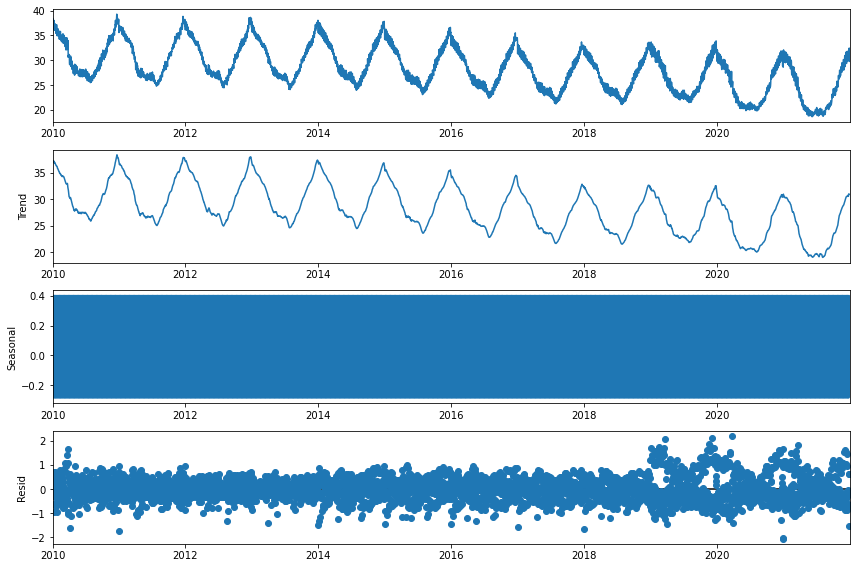

In [9]:
df_pc4_5501_drop = df_pc4_5501.drop(['RES', 'PC4'], axis=1)
decomposition_check = sm.tsa.seasonal_decompose(df_pc4_5501_drop, model='Additive')
plt.rc("figure", figsize=(12,8))
fig = decomposition_check.plot()

In [10]:
df_decomp = pd.DataFrame(decomposition_check.observed, columns=['Observed'])
df_decomp['Trend'] = decomposition_check.trend
df_decomp['Seasonal'] = decomposition_check.seasonal
df_decomp['Residual'] = decomposition_check.resid

<AxesSubplot:xlabel='DATUM'>

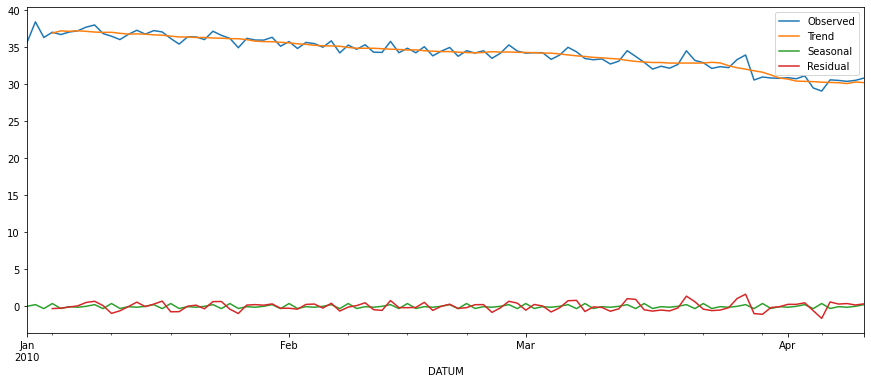

In [11]:
df_decomp.head(100).plot(figsize=(15,6))

<AxesSubplot:xlabel='DATUM'>

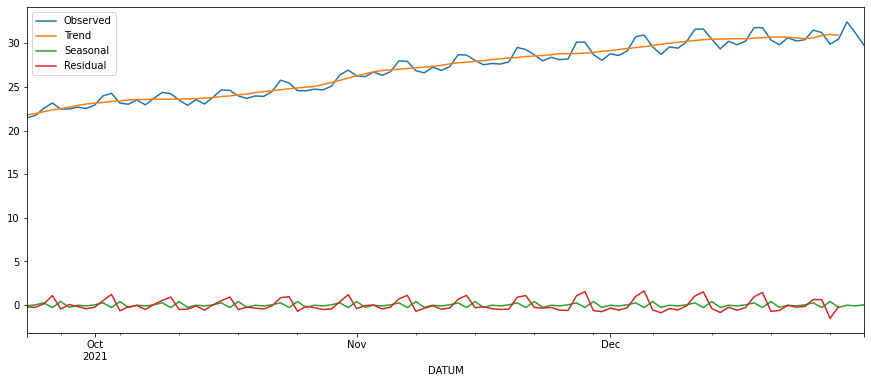

In [12]:
df_decomp.tail(100).plot(figsize=(15,6))

### Building Training/ Test Samples

In [13]:
# date where to split train and test
split_date = '01-Jan-2018'
# starting date of train dataset
from_date = '01-Jan-2010'

df_pc4_5501_train = df_pc4_5501.loc[(df_pc4_5501.index >= from_date) & (df_pc4_5501.index <= split_date) ].copy()
df_pc4_5501_test = df_pc4_5501.loc[df_pc4_5501.index > split_date].copy()
print (f'Length full     dataset: {len(df_pc4_5501)} samples')
print (f'Length training dataset: {len(df_pc4_5501_train)} samples')
print (f'Length test     dataset: {len(df_pc4_5501_test)} samples')


Length full     dataset: 4383 samples
Length training dataset: 2923 samples
Length test     dataset: 1460 samples


### Feature engineering

In [14]:
# Create features from datetime index
def create_features(df, label=None):
    df['date'] = df.index
    df['dayofweek'] = df['date'].dt.dayofweek
    df['month'] = df['date'].dt.month
    df['quarter'] = df['date'].dt.quarter
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','month', 'quarter', 'year', 'dayofyear',
            'dayofmonth', 'weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [15]:
df_pc4_5501_train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2923 entries, 2010-01-01 to 2018-01-01
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   RES       2923 non-null   object 
 1   PC4       2923 non-null   int64  
 2   VERBRUIK  2923 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 91.3+ KB


In [16]:
X_train, y_train = create_features(df_pc4_5501_train, label='VERBRUIK')
X_test, y_test = create_features(df_pc4_5501_test, label='VERBRUIK')

<ipython-input-14-5f3341a1f3b6>:10: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


### Build XGBoost Model

In [17]:
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds = 50,
        verbose = False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

### Plot Feature Importances

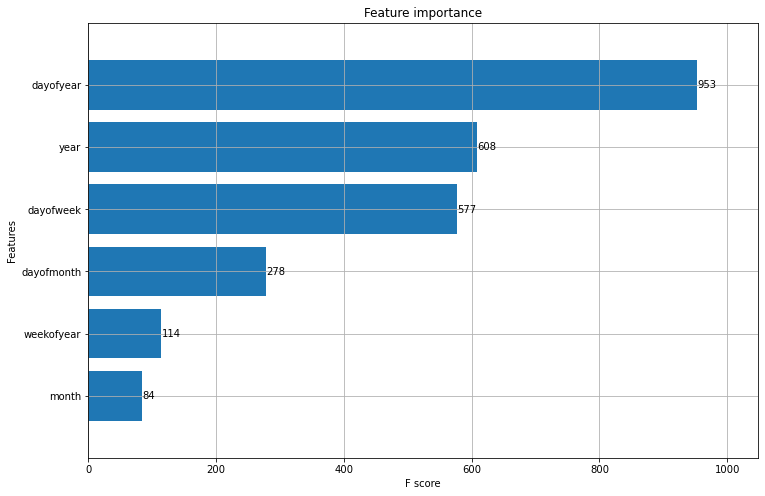

In [18]:
plot_importance(reg, height=0.8);

### Forecast on Test Set

In [19]:
df_pc4_5501_test['Forecast'] = reg.predict(X_test)

In [20]:
df_pc4_5501_test.head(5)

,RES,PC4,VERBRUIK,date,dayofweek,month,quarter,year,dayofyear,dayofmonth,weekofyear,Forecast
DATUM,,,,,,,,,,,,
2018-01-02,Metropoolregio Eindhoven,5501,31.969758,2018-01-02,1,1,1,2018,2,2,1,30.259066
2018-01-03,Metropoolregio Eindhoven,5501,32.710845,2018-01-03,2,1,1,2018,3,3,1,30.259066
2018-01-04,Metropoolregio Eindhoven,5501,32.439281,2018-01-04,3,1,1,2018,4,4,1,30.259066
2018-01-05,Metropoolregio Eindhoven,5501,32.683431,2018-01-05,4,1,1,2018,5,5,1,30.259066
2018-01-06,Metropoolregio Eindhoven,5501,32.017922,2018-01-06,5,1,1,2018,6,6,1,30.259066


In [21]:
df_pc4_5501_all = pd.concat([df_pc4_5501_test, df_pc4_5501_train], sort = False)

### 2010-2021

<AxesSubplot:xlabel='DATUM'>

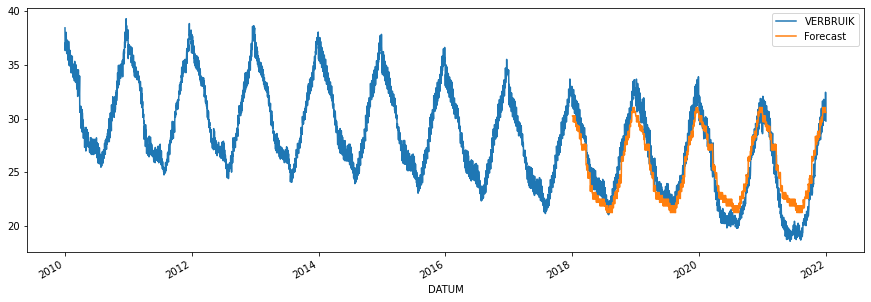

In [22]:
df_pc4_5501_all.loc[df_pc4_5501_all.index > '1-Jan-2010'][['VERBRUIK', 'Forecast']].plot(figsize=(15,5))

### 2018-2021

<AxesSubplot:xlabel='DATUM'>

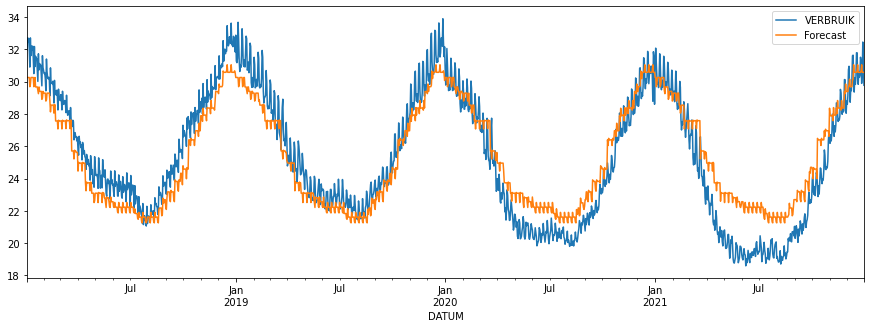

In [23]:
df_pc4_5501_all.loc[df_pc4_5501_all.index > '1-Jan-2018'][['VERBRUIK', 'Forecast']].plot(figsize=(15,5))

### 2018

<AxesSubplot:xlabel='DATUM'>

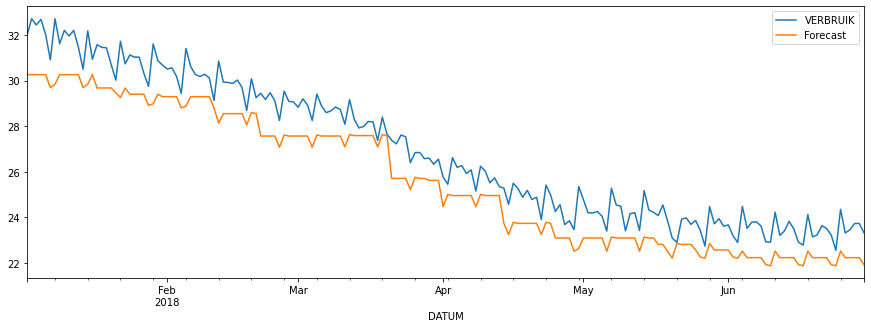

In [24]:
df_pc4_5501_all.loc[(df_pc4_5501_all.index > '1-Jan-2018') & (df_pc4_5501_all.index < '1-Jul-2018')][['VERBRUIK', 'Forecast']].plot(figsize=(15,5))

### 2019

<AxesSubplot:xlabel='DATUM'>

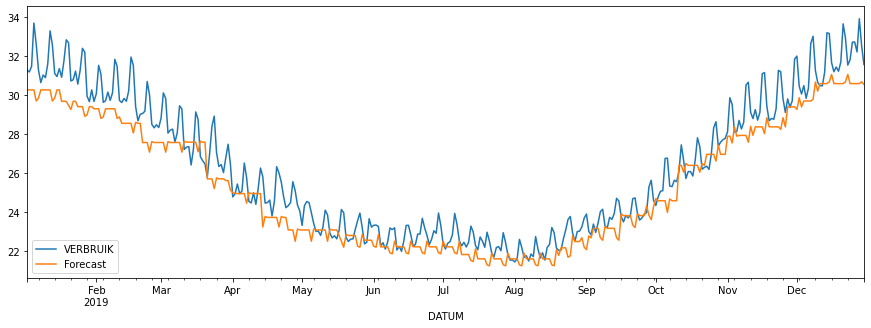

In [25]:
df_pc4_5501_all.loc[(df_pc4_5501_all.index > '1-Jan-2019') & (df_pc4_5501_all.index < '31-Dec-2019')][['VERBRUIK', 'Forecast']].plot(figsize=(15,5))

### 2020

<AxesSubplot:xlabel='DATUM'>

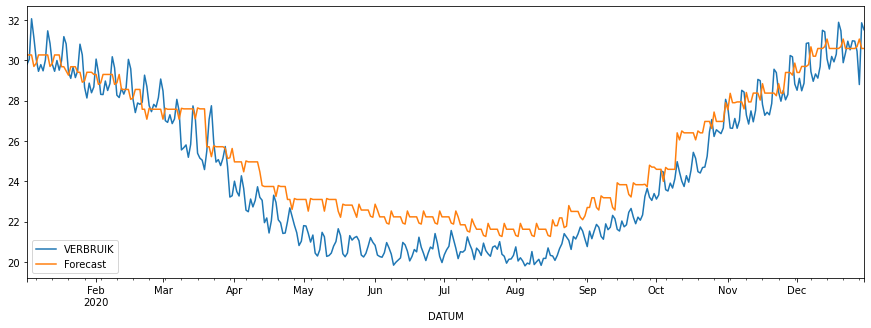

In [26]:
df_pc4_5501_all.loc[(df_pc4_5501_all.index > '1-Jan-2020') & (df_pc4_5501_all.index < '31-Dec-2020')][['VERBRUIK', 'Forecast']].plot(figsize=(15,5))

### 2021

<AxesSubplot:xlabel='DATUM'>

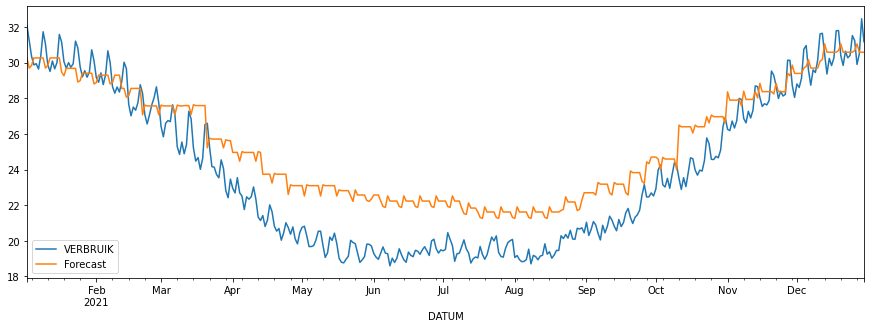

In [27]:
df_pc4_5501_all.loc[(df_pc4_5501_all.index > '1-Jan-2021') & (df_pc4_5501_all.index < '31-Dec-2021')][['VERBRUIK', 'Forecast']].plot(figsize=(15,5))

### Evaluate the Performance

In [28]:
# The MAPE (Mean Absolute Percent Error) measures the size of the error
# in percentage terms.
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [29]:
# Make predictions using the training and testing set
y_train_pred = reg.predict(X_train)
y_test_pred = reg.predict(X_test)

In [30]:
print('R^2   train: %.2f, test: %.2f' % (r2_score(y_train, y_train_pred),
                                       r2_score(y_test, y_test_pred)))

print('MSE   train: %.2f, test: %.2f' %
      (mean_squared_error(y_train, y_train_pred),
       mean_squared_error(y_test, y_test_pred)))

print('RMSE  train: %.2f, test: %.2f' %
      (np.sqrt(mean_squared_error(y_train, y_train_pred)),
       np.sqrt(mean_squared_error(y_test, y_test_pred))))

print('MAE   train: %.2f, test: %.2f' %
      (mean_absolute_error(y_train, y_train_pred),
       mean_absolute_error(y_test, y_test_pred)))

print('MAPE  train: %.2f, test: %.2f' %
      (mean_absolute_percentage_error(y_train, y_train_pred),
       mean_absolute_percentage_error(y_test, y_test_pred)))

print(f'\nMean absolute percent accuracy: {100 - mean_absolute_percentage_error(y_test, y_test_pred):.2f}%')

R^2   train: 0.79, test: 0.84
MSE   train: 3.36, test: 2.47
RMSE  train: 1.83, test: 1.57
MAE   train: 1.72, test: 1.31
MAPE  train: 5.69, test: 5.44

Mean absolute percent accuracy: 94.56%
